# Escaping the manifold

**NOTE:** this notebook is heavily inspired on [Jonathan Whitaker fastai "Stable Diffusion Deep Dive" notebook](https://github.com/fastai/diffusion-nbs/blob/master/Stable%20Diffusion%20Deep%20Dive.ipynb).

**NOTE**: Required dependencies:
```
pip install fastai==2.7.10 \
            transformers==4.25.1 \
            diffusers==0.10.2 \
            accelerate==0.15.0 \
            umap-learn==0.5.3
```

In [1]:
import torch
from transformers import CLIPTextModel, CLIPTokenizer
from transformers import logging
from diffusers import AutoencoderKL, UNet2DConditionModel, LMSDiscreteScheduler
from tqdm.auto import tqdm
from torch import autocast
from PIL import Image
from matplotlib import pyplot as plt
import numpy as np
from torchvision import transforms as tfms

# For video display:
from IPython.display import HTML
from base64 import b64encode

# Supress some unnecessary warnings when loading the CLIPTextModel
logging.set_verbosity_error()

# Set global device
torch_device = "cuda" if torch.cuda.is_available() else "cpu"

# Inspecting VAE

VAE encoder, by design, **don't return a single sample, but a per-pixel distribution**. The final encoded latent is then obtainer by *sampling* this distribution.
This section dive into this trying to understand how this works in terms of input and output and how "different" are the images generated by different samples drawn out of this distribution.

In [2]:
# Load the autoencoder model which will be used to decode the latents into image space. 
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")
vae = vae.to(torch_device)

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 62145  100 62145    0     0   183k      0 --:--:-- --:--:-- --:--:--  183k


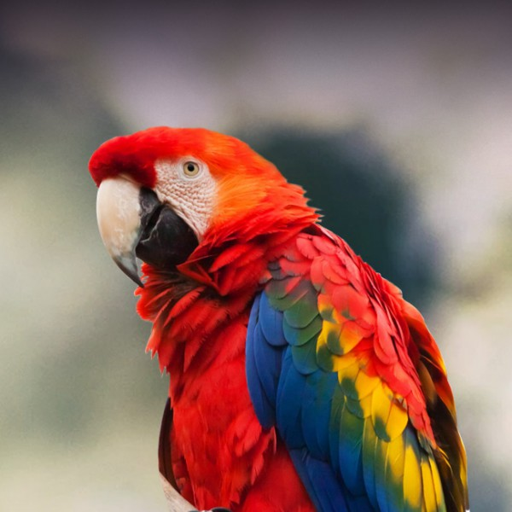

In [3]:
# test image
!curl --output macaw.jpg 'https://lafeber.com/pet-birds/wp-content/uploads/2018/06/Scarlet-Macaw-2.jpg'
# Load the image with PIL
input_image = Image.open('macaw.jpg').resize((512, 512))
input_image

In [4]:
def pil_to_torch(pilImage,device=torch_device):
    return tfms.ToTensor()(pilImage).to(device) #No need to permute: ToTensor() does the trick

assert list(pil_to_torch(input_image).shape) == [3, 512, 512]

In [5]:
input_batch = pil_to_torch(input_image).unsqueeze(0) # sample batch made of a single image
input_batch.shape 

torch.Size([1, 3, 512, 512])

In [6]:
def from_visible_to_vae(batch):
    return batch*2-1 # NOTE: we rescale from 0:+1 -> -1:+1

input_batch.mean(), from_visible_to_vae(input_batch).mean()

(tensor(0.4513, device='cuda:0'), tensor(-0.0974, device='cuda:0'))

In [7]:
def encode_batch(batch):
    with torch.no_grad():
        encoded = vae.encode(from_visible_to_vae(batch).to(torch_device))
        latent_distribution = list(encoded.items())[0][1]
        latents = latent_distribution.sample()
        return latents
    
encode_batch(input_batch).shape

torch.Size([1, 4, 64, 64])

## VAE latent distributions

The encoded image is not a single "latent tensor", but a dedicated class `DiagonalGaussianDistribution` representing a distribution of shape 4x64x64.

In [8]:
with torch.no_grad():
    latent_dist = vae.encode(from_visible_to_vae(input_batch))['latent_dist']
type(latent_dist)

diffusers.models.vae.DiagonalGaussianDistribution

In [9]:
# Per "latent-pixel" MEAN and STD  
latent_dist.mean.shape, latent_dist.std.shape,

(torch.Size([1, 4, 64, 64]), torch.Size([1, 4, 64, 64]))

In [10]:
# Let's inspect this distribution sampling 10_000 points for each "pixel" in the latent space.
# NOTE: working on cpu to avoid gpu memory usage
sample_count = 10_000
vals = torch.normal(latent_dist.mean.unsqueeze(0).detach().cpu().repeat(sample_count,1,1,1,1), # mean
                    latent_dist.std.detach().cpu().unsqueeze(0).repeat(sample_count,1,1,1,1))  # std
vals = vals.reshape([sample_count,-1]).T # each row is a "latent pixel" in a 64x64x4 "latent image" 
vals.shape

torch.Size([16384, 10000])

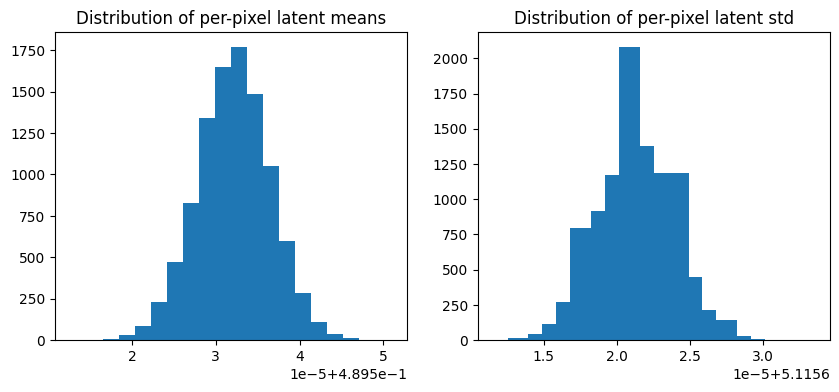

In [11]:
plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.hist(vals.mean(dim=0),bins=20)
plt.title('Distribution of per-pixel latent means');

plt.subplot(1,2,2)
plt.hist(vals.std(dim=0).cpu().numpy(),bins=20)
plt.title('Distribution of per-pixel latent std');

In [12]:
# Concrete latent is a sample from latent distribution predicted by vae
latent_dist.sample().shape

torch.Size([1, 4, 64, 64])

In [13]:
# Let's decode the sample
# NOTE: this will use about additional 2GB to run
with torch.no_grad():
    decoded = vae.decode(latent_dist.sample())

type(decoded)

diffusers.models.vae.DecoderOutput

In [14]:
def decoded_to_image(decoded):
    return ((decoded.sample.squeeze(0).permute([1,2,0])+1)/2).clamp(0,1).cpu()

decoded_image = decoded_to_image(decoded)
decoded_image.shape

torch.Size([512, 512, 3])

In [15]:
input_image_tensor = tfms.ToTensor()(input_image).permute([1,2,0])
input_image_tensor.shape

torch.Size([512, 512, 3])

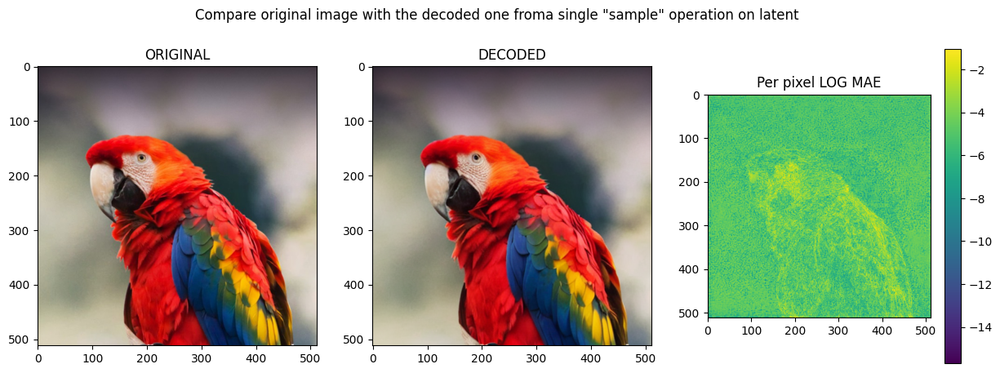

In [16]:
# Compare original image with decoded one from latent space (AKA: VAE ability to reproduce the same output)
plt.figure(figsize=(15,5))
plt.subplot(1,3,1); plt.imshow(input_image_tensor);  plt.title('ORIGINAL')
plt.subplot(1,3,2); plt.imshow(decoded_image); plt.title('DECODED')
plt.subplot(1,3,3); plt.imshow(  (input_image_tensor-decoded_image).mean(dim=2).abs().log()  ); plt.title('Per pixel LOG MAE')
plt.colorbar();
plt.suptitle('Compare original image with the decoded one froma single "sample" operation on latent');

NOTE: as we can see, for this image, the difference between ORIGINAL and DECODED image is very small.

In [17]:
# sample one latent image from distribution: all in one function
def sample_and_convert(latent_dist,vae):
    with torch.no_grad():
        decoded = vae.decode(latent_dist.sample())
        return decoded_to_image(decoded)
        
sample_and_convert(latent_dist,vae).shape

torch.Size([512, 512, 3])

In [18]:
# Trying to sample 32 images from the same latent and measure it's "consistency"
stacked = torch.stack([sample_and_convert(latent_dist,vae) for _ in tqdm(range(32))])
stacked.shape

  0%|          | 0/32 [00:00<?, ?it/s]

torch.Size([32, 512, 512, 3])

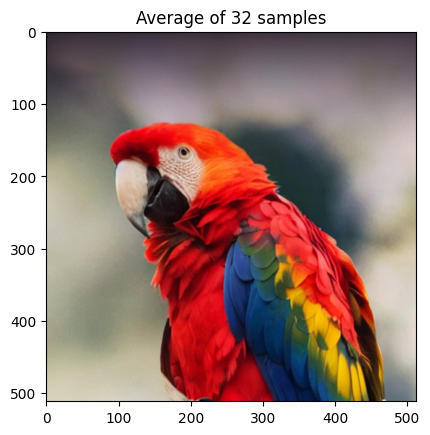

In [19]:
# The average of all the 3d samples is still an image very similar to the original
average_decoded_image = stacked.mean(dim=0)
plt.imshow(average_decoded_image); plt.title('Average of 32 samples');

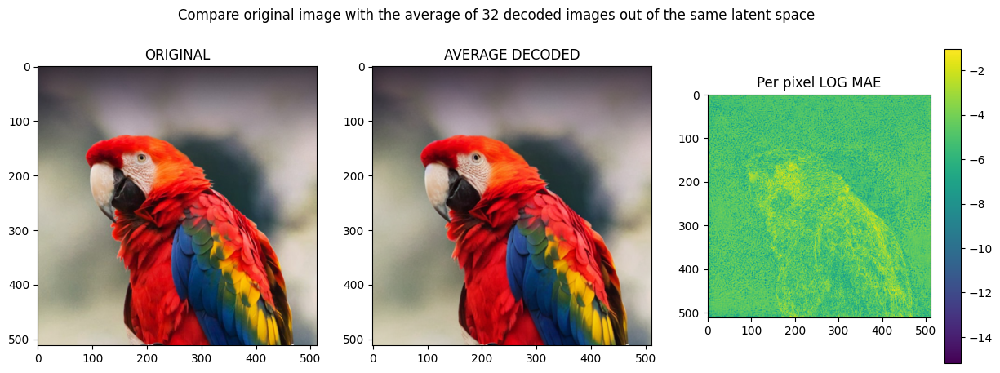

In [20]:
plt.figure(figsize=(15,5))
plt.subplot(1,3,1); plt.imshow(input_image_tensor);  plt.title('ORIGINAL')
plt.subplot(1,3,2); plt.imshow(average_decoded_image); plt.title('AVERAGE DECODED')
plt.subplot(1,3,3); plt.imshow(  (input_image_tensor-average_decoded_image).mean(dim=2).abs().log()  ); plt.title('Per pixel LOG MAE')
plt.colorbar();
plt.suptitle('Compare original image with the average of 32 decoded images out of the same latent space');

In [21]:
# max variance is actually very small, so we can say that 
stacked_std = stacked.std(dim=0)
stacked_std.min(), stacked_std.mean(), stacked_std.max()

(tensor(0.), tensor(1.8576e-05), tensor(0.0003))

In [22]:
rgb_std = stacked.std(dim=0)
rgb_std.shape

torch.Size([512, 512, 3])

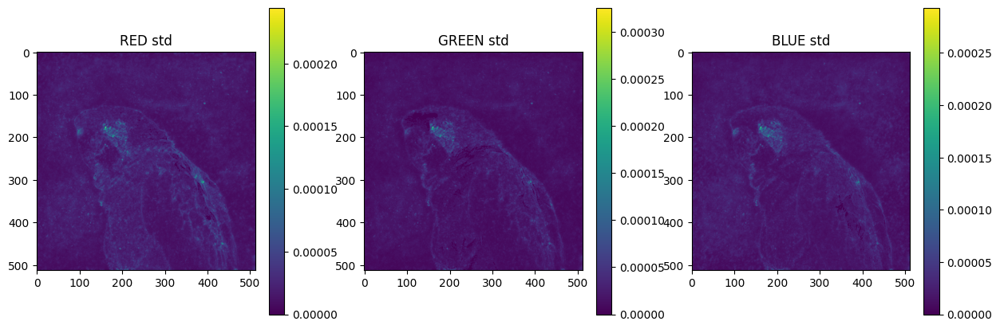

In [23]:
# Per channel std on different image parts
plt.figure(figsize=(15,5))
plt.subplot(1,3,1); plt.imshow(rgb_std[:,:,0]); plt.title('RED std'); plt.colorbar();
plt.subplot(1,3,2); plt.imshow(rgb_std[:,:,1]); plt.title('GREEN std'); plt.colorbar();
plt.subplot(1,3,3); plt.imshow(rgb_std[:,:,2]); plt.title('BLUE std'); plt.colorbar();

# What is a real image
**AKA: can we tell the difference between different kind of images and noise looking at VAE latents?**

The idea is to create a "dataset" containing N samples (`n_samples`) in latent space made from different sources and see if standard dimensionality reduciton methods will be able to properly separate them. If this happens it means that the encoder is actually able to *separate* (aka: "understand the difference") between different type of latents.

**STEP 1: CREATE LATENTS DATASET** 
We'll take the same amount of samples for each group to ensure that each *class* is properly represented (aka, no skew classes).

These are the groups we'll create (classes):
+ **PHOTO**: real images
+ **NOISE**: pure noise image
+ **MIX**: samples mad of real images with noise added (mix is made in the latent space)
+ 🚧 TODO 🚧 **DIGIT**: mnist digits 
+ 🚧 TODO 🚧 **COLOR**: uniform color

**STEP 2: INSPECT LATENTS** 
We'll run TSNE/UMAP on these latents projecting them from 4x64x64=16384 dimensions to 2d space and coloring them by "class".

## STEP 1: CREATE LATENTS DATASET

NOTE: we'll leverage fastai's IMAGENETTE to get real images for this experiment.

In [24]:
from fastai.data.external import untar_data, URLs
path = untar_data(URLs.IMAGENETTE_320)

In [25]:
from fastai.vision.data import ImageDataLoaders
from fastai.vision.augment import Resize

dls = ImageDataLoaders.from_folder(path,valid_pct=0,item_tfms=[Resize(512)],bs=8) # small bs because it's 3x512x512

**NOTE**: we're resizing real images to 3x512x512 to ensure they have the same size.

In [26]:
real_b = dls.one_batch()
real_b[0].shape

torch.Size([8, 3, 512, 512])

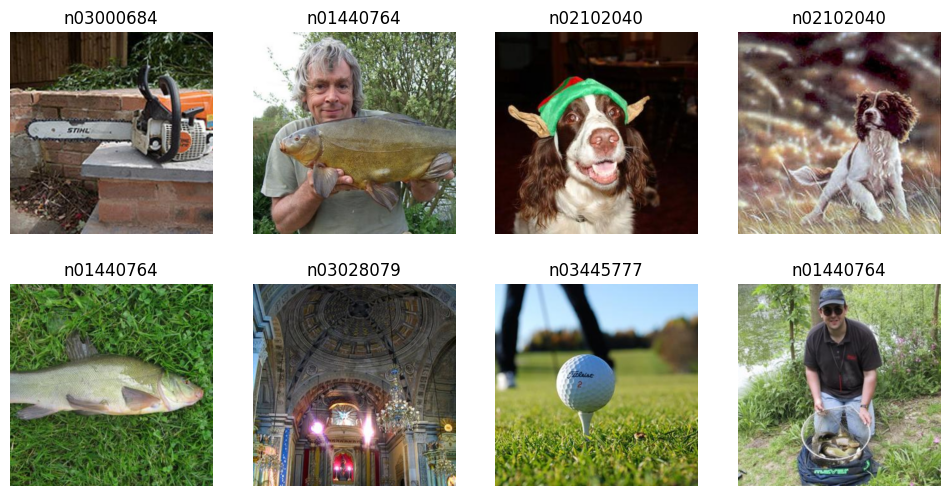

In [27]:
# A batch of "real" images
dls.show_batch(real_b,max_n=dls.bs)

In [28]:
sample_batch_encoded = encode_batch(real_b[0])
sample_batch_encoded.shape

torch.Size([8, 4, 64, 64])

In [29]:
# Hyper parameter: this define the number of samples for each class that we'll have in our dataset
#n_samples = 80 # Quick test
#n_samples = 800 # Meaningful sample
n_samples = 2400 # final plot

In [30]:
batch_count = n_samples // dls.bs
batch_count

300

### Encode some `real` images from imagenette
The first group of latents will be made encoding real images from imagenette. This will define our "REAL" samples.

In [31]:
%%time
# Encode images
real_latents_batches = [(dls.one_batch()[0].cpu(),dls.one_batch()[1].cpu()) for _ in range(batch_count)]
real_latents_batches_encoded = [encode_batch(b[0]) for b in tqdm(real_latents_batches)]
real_latents_arr = torch.concat(real_latents_batches_encoded,dim=0).flatten(start_dim=1).cpu()
real_latents_arr.shape

  0%|          | 0/300 [00:00<?, ?it/s]

CPU times: user 4min 3s, sys: 7.28 s, total: 4min 10s
Wall time: 2min 16s


torch.Size([2400, 16384])

In [32]:
real_labels_arr = torch.concat([b[1] for b in real_latents_batches], dim=0)
real_labels_arr.shape

torch.Size([2400])

### Encode some `pure noise` images

We're creating some pure noise pseudo-images in the latent space; these samples will have the same mean and std of real images latents to make it harder for the network to *distinguish them*.

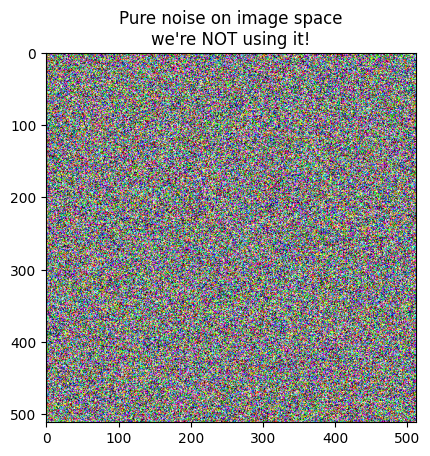

In [33]:
def create_random_image(size,mean,std):
    return torch.randn(size) * std + mean
    
plt.imshow(create_random_image([1,3,512,512],.5,1).squeeze(0).permute([1,2,0]).clip(0,1));
plt.title("Pure noise on image space\nwe're NOT using it!");

The idea is to create our "noisy latent samples" adding noise on the latent space with the same mean and standard deviation of a group of real images.
If we create the noisy samples encoding noise images (in RGB space like the picture above) we'll have a different distribution that will lead to an easier problem.

In [34]:
# These are the stats on RGB space
noise_mean = float(real_b[0].mean().cpu())
noise_std  = float(real_b[0].std().cpu())

noise_mean,noise_std

(0.38837742805480957, 0.24323749542236328)

In [35]:
# Use real images stats to be more "close" to valid manifold
latent_noise_mean = float(real_latents_arr.cpu().mean())
latent_noise_std  = float(real_latents_arr.cpu().std())

latent_noise_mean,latent_noise_std

(0.7457608580589294, 5.380990028381348)

**IMPORTANT**: we're adding noise on the latent space with the same "distribution" of the latents created from real images, in order to not have an easy way tor the network to distinguish it from the rest.

In [36]:
latent_noise_size = sample_batch_encoded.shape
latent_noise_size

torch.Size([8, 4, 64, 64])

In [37]:
%%time
# Encode images
noise_latents_arr = torch.concat([create_random_image(latent_noise_size,latent_noise_mean,latent_noise_std).cpu() for _ in range(batch_count)], dim=0)
noise_latents_arr = noise_latents_arr.flatten(start_dim=1) # one sample per row
noise_latents_arr.shape

CPU times: user 2.22 s, sys: 71.8 ms, total: 2.29 s
Wall time: 147 ms


torch.Size([2400, 16384])

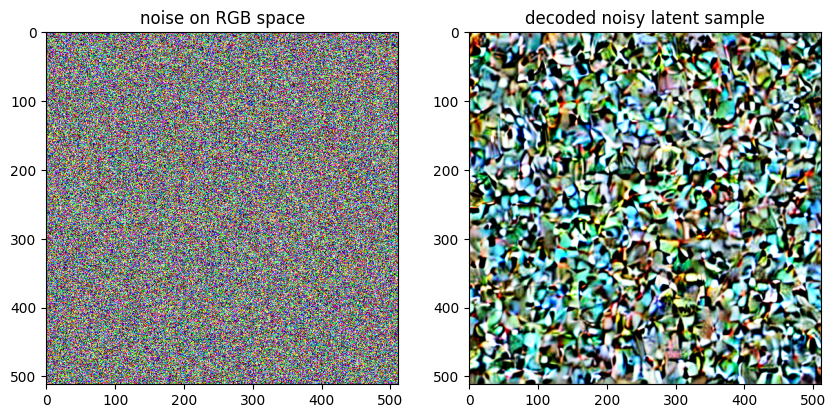

In [38]:
with torch.no_grad():
    decoded_image = decoded_to_image((vae.decode(noise_latents_arr[0].reshape([1,4,64,64]).to(torch_device))))
    
plt.figure(figsize=(10,6))
plt.subplot(1,2,1);
plt.imshow(create_random_image([1,3,512,512],.5,1).squeeze(0).permute([1,2,0]).clip(0,1));
plt.title("noise on RGB space");
plt.subplot(1,2,2); plt.imshow(decoded_image); plt.title('decoded noisy latent sample');

As we can see, decoded latent noise and noise on RGB space leads to very different result.

## Noisy encoded images
We're creating now the noisy samples, made combining latents from real images and pure noise.

**IMPORTANT**: to avoid modifying the stats too much **we'll add noise with mean=0**. It's important to remember that VAE values are supposed to be in [-1:+1] domain, so adding noise with zero mean shuld not alter the signal too much.

**IMPORTANT**: we'll sample **different images** from imagenette to do this in order to avoid having any kind of values similarity respect to the REAL images class. 

In [39]:
%%time
# Encode images
# IMPORTANT: these are different images from the previous ones
image_mix_latents_batches = [(dls.one_batch()[0].cpu(),dls.one_batch()[1].cpu()) for _ in range(batch_count)]
image_mix_latents_batches_encoded = [encode_batch(b[0]) for b in tqdm(image_mix_latents_batches)]
image_mix_latents_arr = torch.concat(image_mix_latents_batches_encoded,dim=0).flatten(start_dim=1).cpu()
image_mix_latents_arr.shape

  0%|          | 0/300 [00:00<?, ?it/s]

CPU times: user 4min 6s, sys: 1.64 s, total: 4min 7s
Wall time: 2min 16s


torch.Size([2400, 16384])

In [40]:
%%time
# Noise to add
mix_samples_noise_std = 5.0 
mix_noise_latents_arr = torch.concat([create_random_image(latent_noise_size,0,mix_samples_noise_std).cpu() for _ in range(batch_count)], dim=0)
mix_noise_latents_arr = mix_noise_latents_arr.flatten(start_dim=1) # one sample per row
mix_noise_latents_arr.shape

CPU times: user 1.82 s, sys: 54.7 ms, total: 1.88 s
Wall time: 121 ms


torch.Size([2400, 16384])

In [41]:
image_mix_latents_arr.shape, mix_noise_latents_arr.shape

(torch.Size([2400, 16384]), torch.Size([2400, 16384]))

In [42]:
# add noise
mix_latents_arr = image_mix_latents_arr + mix_noise_latents_arr

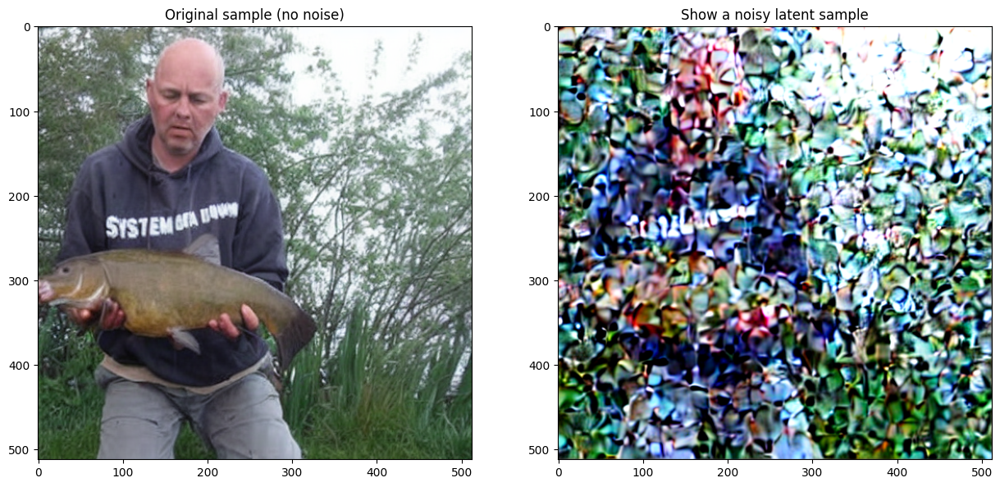

In [43]:
with torch.no_grad():
    decoded_image_no_noise = decoded_to_image((vae.decode(image_mix_latents_arr[0].reshape([1,4,64,64]).to(torch_device))))
    decoded_image = decoded_to_image((vae.decode(mix_latents_arr[0].reshape([1,4,64,64]).to(torch_device))))
    
plt.figure(figsize=(15,7))
plt.subplot(1,2,1); plt.imshow(decoded_image_no_noise); plt.title('Original sample (no noise)');
plt.subplot(1,2,2); plt.imshow(decoded_image); plt.title('Show a noisy latent sample');

**IMPRTANT**: `mix_samples_noise_std` has been chosen such as visually it leads to noisy result (AKA: a human can still distinguish what's there).

## Ensemble final latents dataset

In [44]:
real_latents_arr.shape, mix_latents_arr.shape, noise_latents_arr.shape

(torch.Size([2400, 16384]),
 torch.Size([2400, 16384]),
 torch.Size([2400, 16384]))

In [45]:
# This is a high level 
dataset_definition = [
 ('REAL',real_latents_arr,'green','real images'),
 ('MIX',mix_latents_arr,'orange','noisy images'),
 ('NOISE',noise_latents_arr,'red','pure noise'),
# ('COLOR',color_latents_arr,'blue','solid color'),
# ('MNIST',color_latents_arr,'magenta','minist digits'),
]

In [46]:
xx = torch.concat([t[1] for t in dataset_definition])
yy = np.concatenate([[t[0]]*len(t[1]) for t in dataset_definition])

xx.shape, yy.shape

(torch.Size([7200, 16384]), (7200,))

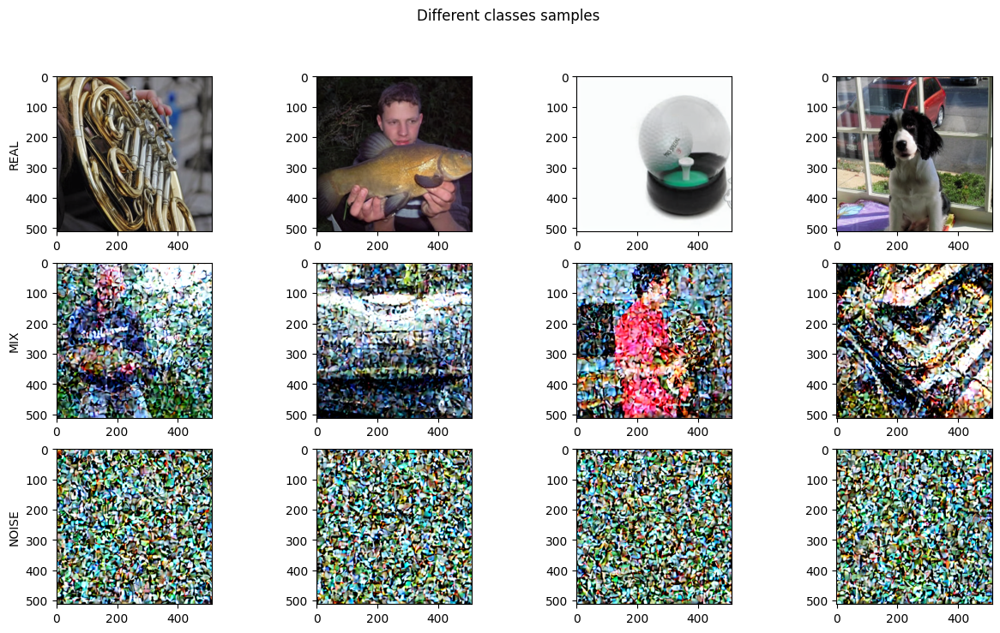

In [47]:
# Inspect some samples from different classes
ncols = 4
nrows = len(dataset_definition)
fig,axs = plt.subplots(nrows,ncols,figsize=(15,8))
with torch.no_grad():
    for i,d in enumerate(dataset_definition):
        cls = d[0]
        lats = xx[yy==cls][:ncols].reshape([-1,4,64,64])
        axs[i][0].set_ylabel(cls)
        for j,lat in enumerate(lats):
            decoded = vae.decode(lat.unsqueeze(0).to(torch_device))
            img = decoded_to_image(decoded)
            ax = axs[i][j]
            ax.imshow(img)
plt.suptitle('Different classes samples');

## STEP 2: INSPECT LATENTS

We've now have a bunch of latents in a 4x64x64=16384 dimensional space and we're squeezing them down to 2d space using:
* PCD+TSNE: 16384 -(PCA)-> 50 -(TSNE)-> 2
* TSNE ONLY: Fitting all data
* UMAP: Fitting 2k samples and making inference on all of them (kind of unsupervised learning).

In [48]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

#NOTE: to recap the syntax on PCA, TSNE, UMAP
#check https://towardsdatascience.com/dimensionality-reduction-for-data-visualization-pca-vs-tsne-vs-umap-be4aa7b1cb29

### PCA+TSNE
We first use PCA to linearly reduce dimensionality to 50 (aka linearly keeping most important linear combinaiton of actual dimensions) and then use tsne to non linerly reduce from 50 to 2.

WARNING: PCA is having some troubles in dealing with noise. I'm disabling int.

### USE TSNE

IMPORTANT: we're init TSNE using 'pca' to increase reproducibility of the plots.

NOTE: TSNE need to see all the data that will be analized.

In [49]:
[d[0] for d in dataset_definition]

['REAL', 'MIX', 'NOISE']

In [50]:
%%time
# With tsne we shoult "lay out" all out data at once
tsne = TSNE(random_state = 123, n_components=2,verbose=1, perplexity=40, n_iter=10000, init='pca', learning_rate='auto')
tsne_result = tsne.fit_transform(xx)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 7200 samples in 0.042s...
[t-SNE] Computed neighbors for 7200 samples in 3.452s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7200
[t-SNE] Computed conditional probabilities for sample 2000 / 7200
[t-SNE] Computed conditional probabilities for sample 3000 / 7200
[t-SNE] Computed conditional probabilities for sample 4000 / 7200
[t-SNE] Computed conditional probabilities for sample 5000 / 7200
[t-SNE] Computed conditional probabilities for sample 6000 / 7200
[t-SNE] Computed conditional probabilities for sample 7000 / 7200
[t-SNE] Computed conditional probabilities for sample 7200 / 7200
[t-SNE] Mean sigma: 145.820999


/home/dldev/.conda/envs/dldev/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 142.370041
[t-SNE] KL divergence after 10000 iterations: 3.700759
CPU times: user 25min 45s, sys: 38.3 s, total: 26min 24s
Wall time: 1min 37s


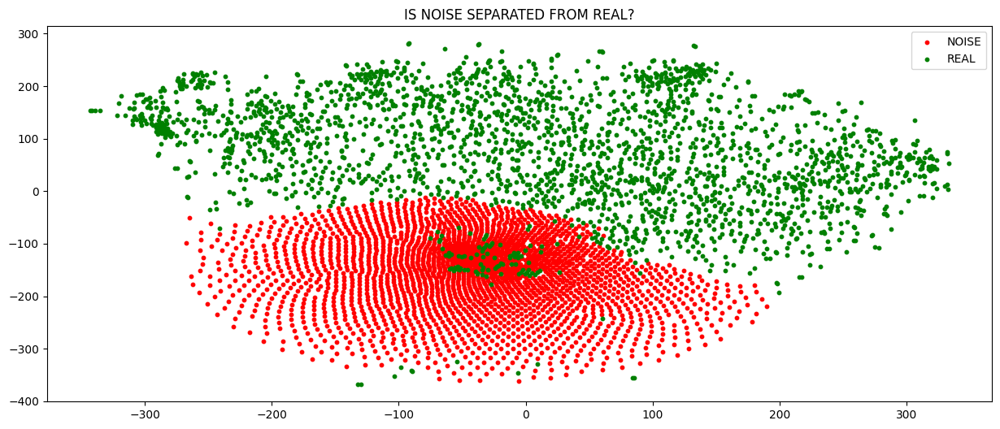

In [51]:
plt.figure(figsize=(15,6))
for i,d in enumerate(reversed(dataset_definition)):
    cls,color = d[0],d[2]
    if cls=='MIX': continue # skip MIX
    mask = np.array(yy)==cls
    plt.scatter(*(tsne_result[mask]).T,label=cls,s=10,color=color)
plt.legend();
plt.title('IS NOISE SEPARATED FROM REAL?');

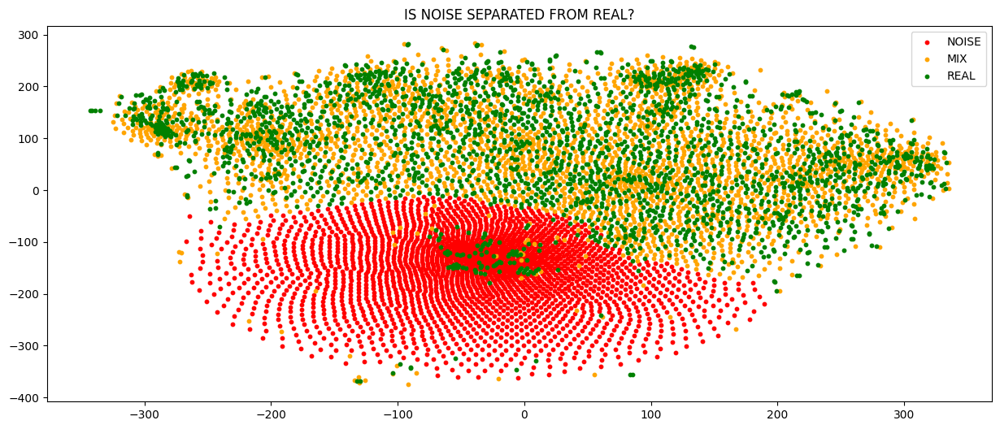

In [52]:
plt.figure(figsize=(15,6))
for i,d in enumerate(reversed(dataset_definition)):
    cls,color = d[0],d[2]
    mask = np.array(yy)==cls
    plt.scatter(*(tsne_result[mask]).T,label=cls,s=10,color=color)
plt.legend();
plt.title('IS NOISE SEPARATED FROM REAL?');

This picture seems really interesting: t-SNE clearly see some pattern in *Normal noise*, and despite not a clear structure arises, MIX samples seems to be floating around clusters of real images. 

### Reduce dimensionality with UMAP

**UMAP:** *Uniform Manifold Approximation and Projection for Dimension Reduction*

This dimensionality technique is designed to deal with high dimensional manifolds, that is exactly what we need.

See https://umap-learn.readthedocs.io/en/latest/index.html

In [53]:
#!pip install umap-learn

In [54]:
import umap

In [55]:
%%time
reducer = umap.UMAP(n_components=2,low_memory=True,random_state=123)
#umap_result = reducer.fit_transform(xx);

CPU times: user 11 µs, sys: 0 ns, total: 11 µs
Wall time: 12.9 µs


In [56]:
%%time
# Fit on a smaller subset
idx = torch.randperm(xx.size(0))[:2000] # random take first 1k
reducer.fit(xx[idx]);

CPU times: user 12.6 s, sys: 1.72 s, total: 14.3 s
Wall time: 11.4 s


UMAP(random_state=123, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True})

In [57]:
%%time
umap_result = reducer.transform(xx) # transform all

CPU times: user 58.6 s, sys: 114 ms, total: 58.7 s
Wall time: 57.6 s


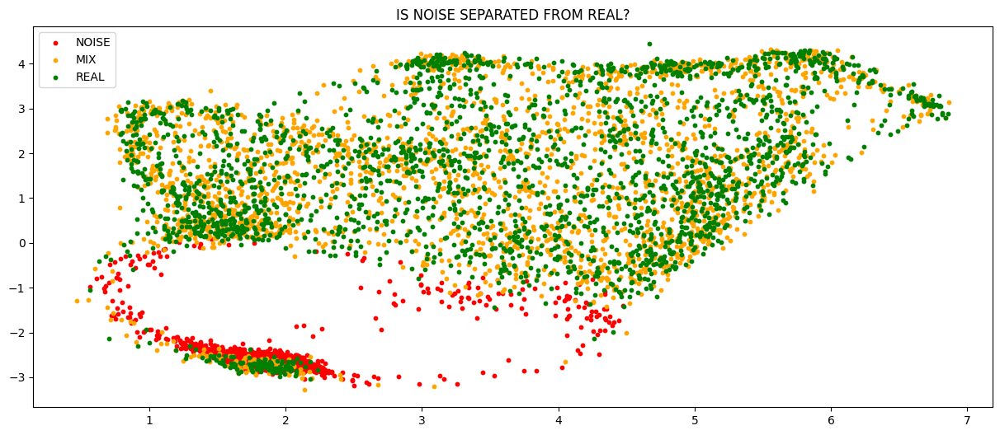

In [58]:
plt.figure(figsize=(15,6))
for i,d in enumerate(reversed(dataset_definition)):
    cls,color = d[0],d[2]
    mask = np.array(yy)==cls
    plt.scatter(*(umap_result[mask]).T,label=cls,s=10,color=color)
plt.legend();
plt.title('IS NOISE SEPARATED FROM REAL?');

# Probing the valid images manifold
AKA: Searching for the real images island.

## Creating the noise paths
The idea is to create from a single "starting real image" multiple noise paths following the tree approach showed in this figure. We make this to "model" the fact that there are infinite way to move from a real image to pure noise.

It's important to notice that this "infinite path" idea works in the same way even in the opposite direction: given a noise sample and a prompt (aka the direction where we want to go), no matter how detailed is the prompt, we have infinite many way to "converge" to a real image.

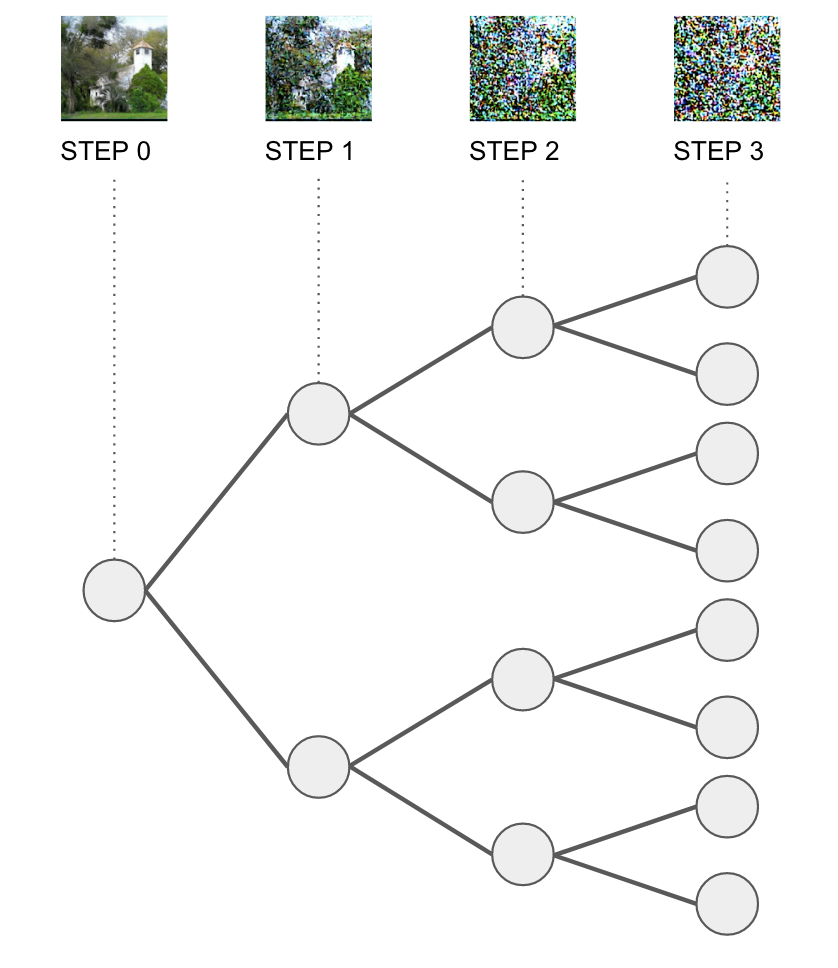

In [59]:
# Hyper parameters
latent_samples = 80 # number of real images samples
steps = 5 # number of noise steps (0 is no noise)
variants = 2 # number of differnt splits

max_noise = 30 # max amount of noise

Let's define our data.
There will be ´steps´ levels of noise and each steps will have a certain amount of `variants`.
For example if `steps=4` and `variants=2` we'll have a total of: `T = 2**0 + 2**1 + 2**2 + 2**3 = 15` different variations.

In [60]:
# MODE-1
noise_idx = [[i]*(variants**i) for i in range(0,steps)]
noise_idx

[[0],
 [1, 1],
 [2, 2, 2, 2],
 [3, 3, 3, 3, 3, 3, 3, 3],
 [4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]]

In [61]:
flat_noise_idx = np.concatenate(noise_idx)
flat_noise_idx

array([0, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4])

In [62]:
# This array maps the position id of the indes in the flatten array in general way
from copy import deepcopy
noise_idx_pos = deepcopy(noise_idx)
k=0
for i,r in enumerate(noise_idx):
    for j,q in enumerate(r):
        #print(i,j,q) # coordinates
        noise_idx_pos[i][j] = k
        k += 1
noise_idx_pos

[[0],
 [1, 2],
 [3, 4, 5, 6],
 [7, 8, 9, 10, 11, 12, 13, 14],
 [15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]]

In [63]:
noise_values = torch.linspace(0,max_noise,steps)
noise_values

tensor([ 0.0000,  7.5000, 15.0000, 22.5000, 30.0000])

In [64]:
noises = noise_values[flat_noise_idx]
noises

tensor([ 0.0000,  7.5000,  7.5000, 15.0000, 15.0000, 15.0000, 15.0000, 22.5000,
        22.5000, 22.5000, 22.5000, 22.5000, 22.5000, 22.5000, 22.5000, 30.0000,
        30.0000, 30.0000, 30.0000, 30.0000, 30.0000, 30.0000, 30.0000, 30.0000,
        30.0000, 30.0000, 30.0000, 30.0000, 30.0000, 30.0000, 30.0000])

In [65]:
src_noise = torch.stack([create_random_image([latent_samples,real_latents_arr.shape[1]],mean=0,std=e).cpu() for e in noises])
src_noise.shape

torch.Size([31, 80, 16384])

In [66]:
src_img = real_latents_arr[:latent_samples].unsqueeze(0) # leveraging existing latents computed previously.
src_img = src_img.repeat(src_noise.shape[0],1,1)
src_img.shape

torch.Size([31, 80, 16384])

In [67]:
# Src contains the same "latent_samples" images with "steps" different levels of nois 0..10
src = src_img + src_noise
src.shape

torch.Size([31, 80, 16384])

**NOTE**: The shape of `src` is FLATTEN_NOISE_LEVELS x ORIGINAL_IMAGE_COUNT x LATENT

In [68]:
# MODE-1
# Sample of the possible paths to escape using specified variants. Each "row" is a possible escape sequence.
noise_sequence_idxs = torch.tensor([sorted(noise_idx_pos[i]*len(noise_idx[steps-i-1])) for i in range(steps)]).T
noise_sequence_idxs

tensor([[ 0,  1,  3,  7, 15],
        [ 0,  1,  3,  7, 16],
        [ 0,  1,  3,  8, 17],
        [ 0,  1,  3,  8, 18],
        [ 0,  1,  4,  9, 19],
        [ 0,  1,  4,  9, 20],
        [ 0,  1,  4, 10, 21],
        [ 0,  1,  4, 10, 22],
        [ 0,  2,  5, 11, 23],
        [ 0,  2,  5, 11, 24],
        [ 0,  2,  5, 12, 25],
        [ 0,  2,  5, 12, 26],
        [ 0,  2,  6, 13, 27],
        [ 0,  2,  6, 13, 28],
        [ 0,  2,  6, 14, 29],
        [ 0,  2,  6, 14, 30]])

In [69]:
noise_sequence_idxs.shape

torch.Size([16, 5])

In [70]:
def decode_image(latent):
    with torch.no_grad():
        return decoded_to_image((vae.decode(latent.reshape([1,4,64,64]).to(torch_device))))

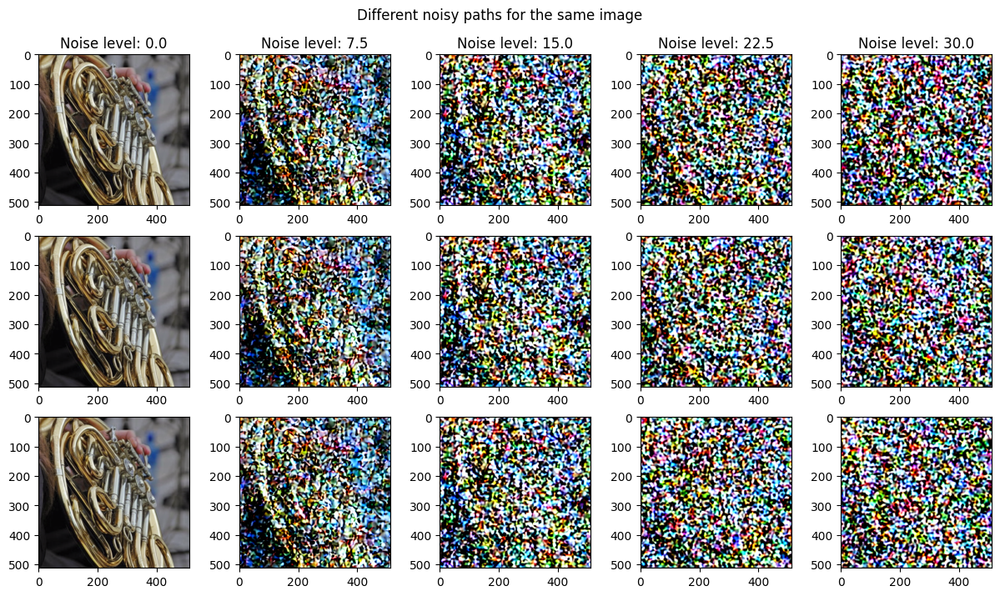

In [71]:
plt.figure(figsize=(15,8))
rows = 3
for j,noise_sequence_idx in enumerate(noise_sequence_idxs[:rows]):
    for i,idx in enumerate(noise_sequence_idx):
        plt.subplot(rows,steps,(steps*j)+i+1)
        plt.imshow(decode_image(src[idx][0]))
        if j==0: plt.title(f'Noise level: {noise_values[i]}')
plt.suptitle('Different noisy paths for the same image',y=.95);

**IMPORTANT**: There are **infinite way to escape the island**, we're modeling only one of them, so let's add some more escape samples.

In [72]:
src.reshape([31,80,4,64,64]).shape

torch.Size([31, 80, 4, 64, 64])

In [73]:
%%time
src_flat = src.reshape([-1,src.shape[-1]])
reducer = umap.UMAP(n_components=2,low_memory=True,random_state=123,n_neighbors=steps)
reducer.fit(src_flat); # 

CPU times: user 13.4 s, sys: 1.65 s, total: 15.1 s
Wall time: 12.5 s


UMAP(n_neighbors=5, random_state=123, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True})

In [74]:
src_xy = reducer.transform(src_flat)
src_xy = src_xy.reshape(src.shape[0],latent_samples,-1)
src_xy.shape

(31, 80, 2)

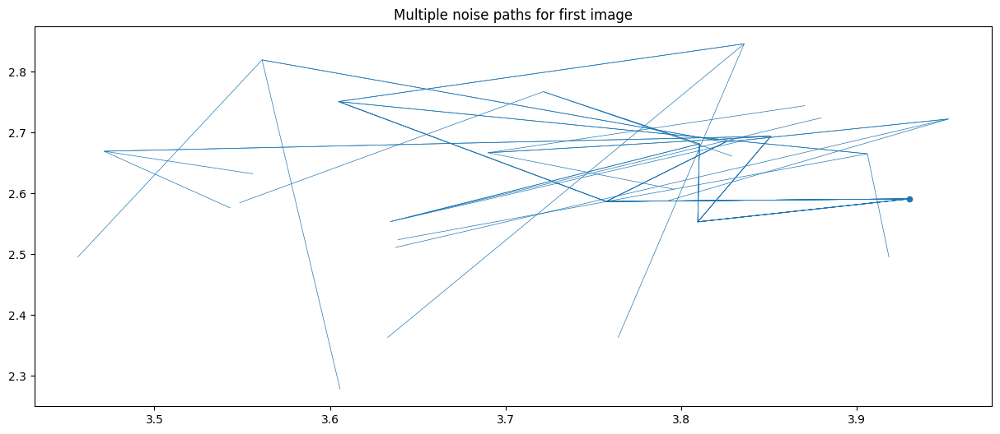

In [75]:
import matplotlib
plt.figure(figsize=(15,6))
src_xy_t = torch.tensor(src_xy).permute([1,0,2]) # permute having images in first position
for i,c in enumerate(src_xy_t[:1]):
    color = matplotlib.cm.tab20(float(i)/len(src_xy_t))
    t = plt.scatter(c[0,0],c[0,1],s=20,color=color) # start point
    for noise_sequence_idx in noise_sequence_idxs:
        plt.plot(c[noise_sequence_idx,0],c[noise_sequence_idx,1],color=color,linewidth=.5)
plt.title('Multiple noise paths for first image');

Big dot is the real image with no noise. From there all the lines are "escape path" (aka: incremental noise addition till max value).
As we can see dimensionality reduction is not able to "grasp" the consept of noise.

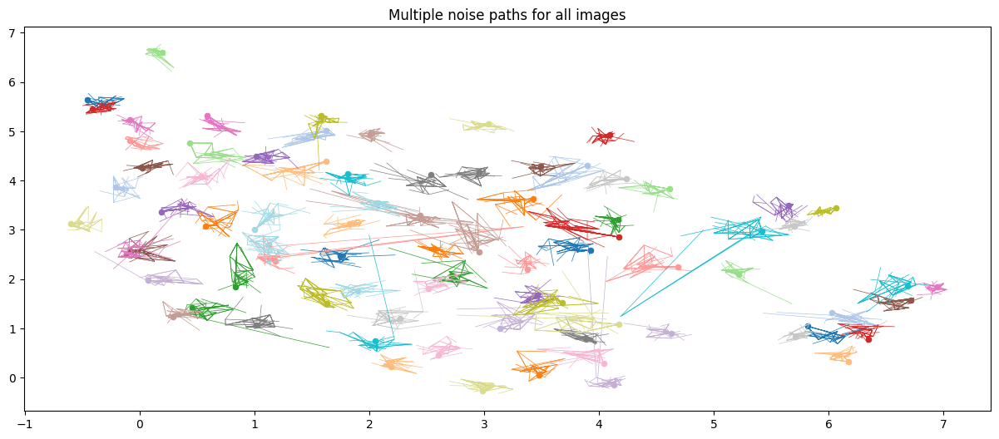

In [76]:
plt.figure(figsize=(15,6))
src_xy_t = torch.tensor(src_xy).permute([1,0,2]) # permute having images in first position
for i,c in enumerate(src_xy_t):
    color = matplotlib.cm.tab20(float(i)/len(src_xy_t))
    t = plt.scatter(c[0,0],c[0,1],s=20,color=color) # start point
    for noise_sequence_idx in noise_sequence_idxs:
        plt.plot(c[noise_sequence_idx,0],c[noise_sequence_idx,1],color=color,linewidth=.5)
plt.title('Multiple noise paths for all images');

The color represents a different kind of real image. It's clear that dimensionality reduction is able to grasp the difference between images and **surprisingly it distinguish images wiht a lot of noise too, better than a human**.

In [77]:
src.shape

torch.Size([31, 80, 16384])

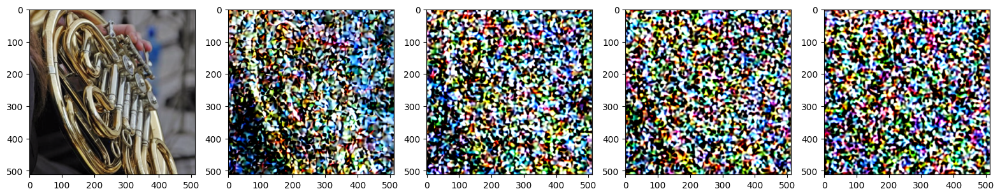

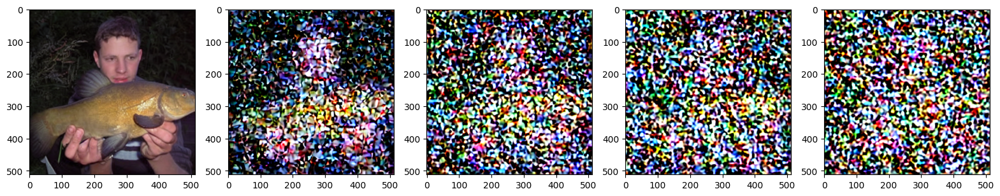

In [78]:
# Display two paths
plt.figure(figsize=(4*len(src),4))
for i,j in enumerate(noise_sequence_idxs[0]):
    plt.subplot(1,len(src),i+1)
    plt.imshow(decode_image(src[j][0]))
    
plt.figure(figsize=(4*len(src),4))
for i,j in enumerate(noise_sequence_idxs[0]):
    plt.subplot(1,len(src),i+1)
    plt.imshow(decode_image(src[j][1]))

In [79]:
%%time
# With tsne we shoult "lay out" all out data at once
tsne = TSNE(random_state = 123, n_components=2,verbose=1, perplexity=5, n_iter=10000, init='pca', learning_rate='auto')
tsne_result = tsne.fit_transform(src_flat)

[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 2480 samples in 0.016s...
[t-SNE] Computed neighbors for 2480 samples in 0.960s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2480
[t-SNE] Computed conditional probabilities for sample 2000 / 2480
[t-SNE] Computed conditional probabilities for sample 2480 / 2480
[t-SNE] Mean sigma: 384.698566


/home/dldev/.conda/envs/dldev/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 91.075165
[t-SNE] KL divergence after 10000 iterations: 3.241681
CPU times: user 8min 24s, sys: 15.4 s, total: 8min 39s
Wall time: 21.8 s


In [80]:
1-noises/(noises.max()+5)

tensor([1.0000, 0.7857, 0.7857, 0.5714, 0.5714, 0.5714, 0.5714, 0.3571, 0.3571,
        0.3571, 0.3571, 0.3571, 0.3571, 0.3571, 0.3571, 0.1429, 0.1429, 0.1429,
        0.1429, 0.1429, 0.1429, 0.1429, 0.1429, 0.1429, 0.1429, 0.1429, 0.1429,
        0.1429, 0.1429, 0.1429, 0.1429])

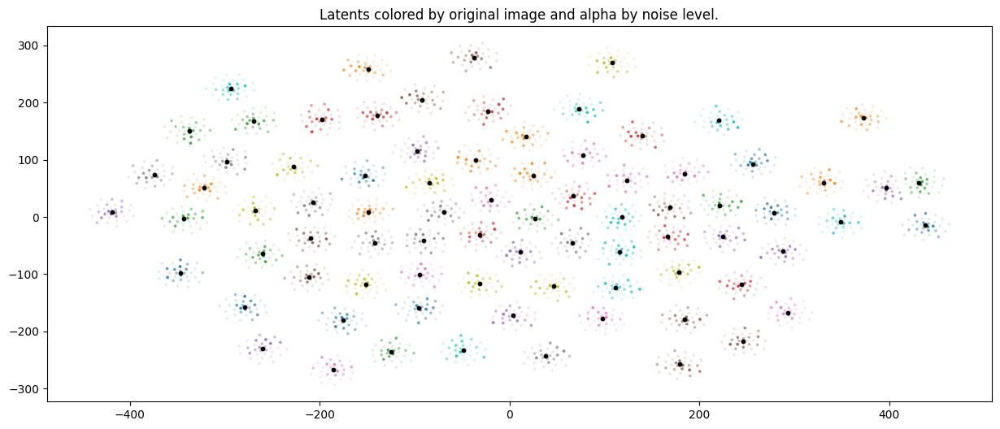

In [81]:
plt.figure(figsize=(15,6))
for c in tsne_result.reshape([*src.shape[:2],2]).transpose([1,0,2]): # color by image
    plt.scatter(*(c).T,s=3,alpha=1-noises/(noises.max()+3));
    plt.scatter(c[0][0],c[0][1],s=10,color='k'); # original image 
plt.title('Latents colored by original image and alpha by noise level.');

Even TSNE it's able to move all the variations of the same real image close to each other; moreover, surprisingly, the original image is always in the center of the cluster and increasing noise levels ge far away from that, even if the distance from center is not proportional to noise level.

# Searching for the island using UNET

## The Manifold Hypothesys

[**THE MANIFOLD HYPOTHESYS:**](https://en.wikipedia.org/wiki/Manifold_hypothesis) sais that:

*he manifold hypothesis is the hypothesis that many high-dimensional data sets that occur in the real world actually lie along low-dimensional manifolds inside that high-dimensional space*.

The best visual explanaiton I've found is [My understanding of the Manifold Hypothesis](https://www.youtube.com/watch?v=BePQBWPnYuE): check it out it leads for sure to a very good intuition of the manifold and how to move around.

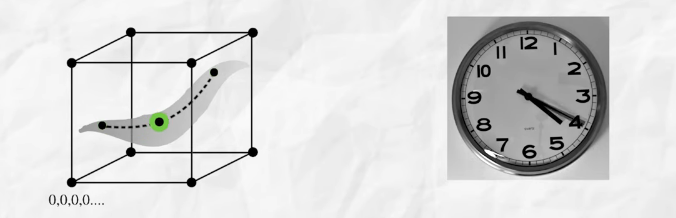

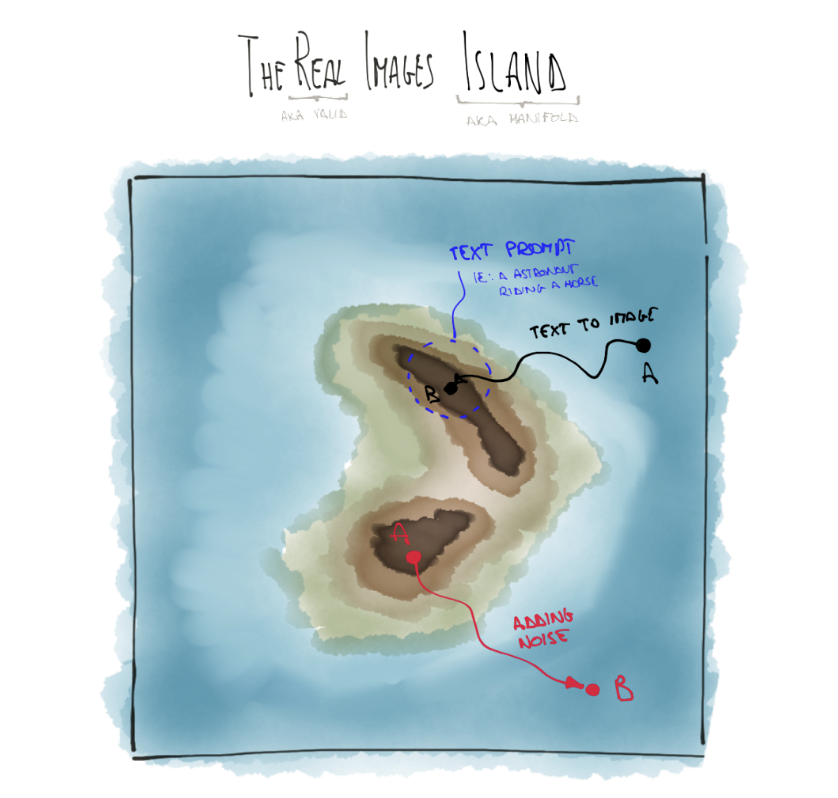

**The Real Images Island** *(AKA: The Valid Images Manifold)*

This reasearch is an attempt to prove the exsistence of the "real images  manifold" (our "Island"). From the manifold hypothesys we know that if we pick a point in our embedding space outside of the manifold there is a high chance that it's associated with complete noise.
The property we want to prove is that if we add noise to the latent of a real image "we move away" from the manifold and the more noise we add the more distant we'll go to that.

If this island exists and has the property we want to prove, the metaphor of island can be used to describe or get intuitions about the different process we want to do:
* **TRAINIG UNET MODULE**: is the same as starting from some valid points (peaks) and adding noise escaping away from the island.
* **INFERENCE GENERATING NEW IMAGES**: we start from a point in the sea of noise and we search the highest peak of sharpness in the direction of the prompt.
* **INTERPOLATE**: we have a nice interpolation between two latents if we walk on the peak of our island between the two points.

**NOTE:** in stable diffusion, UNET module has been designed to measure and predict the noise on the image given a certain direction (prompt) we want to go in the denoising process. 
This section is all about analyzing what's happening in the *bottleneck* inside the UNET.

**COLORMAP MEANING**: The colormap measure the *noisiness* of the image and reange:
+ From the **peak of sharpness** of a real image latent.
+ To the deep **sea of noise** of pure latent noise sample.

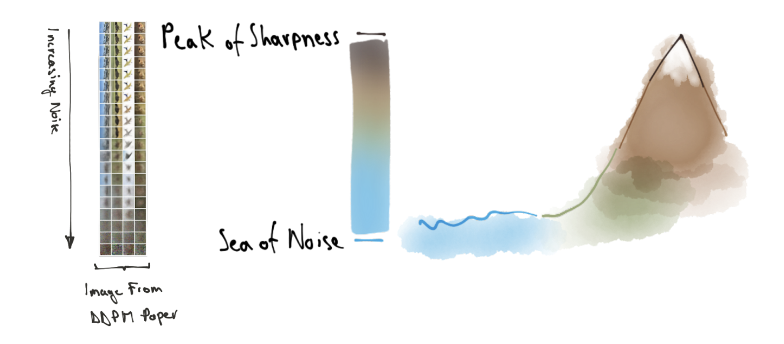

**NEXT STEPS:**
1. Get the UNET ENCODER and encode our dataset of latents to produce `unet_latents`.

2. Visualize `unet_latents` with UMAP dimensionality reduction method.

**NOTE:** As we saw on previous section, simple VAE encoder is not able to properly grasp the concept of "noise".
In stable diffusion architecture, the output of VAE is fed into UNET together with the prompt in order to stripe out the noise and "guide" the latents towards a specific target.

**Imagine the VAE as your vehicle, UNET as the "navigation system" and the prompt as the destination you want to go.**
Who drives you from the deep sea of noise to the peak of real image sharpness is the UNET, a component that has been designed to separate the noise from a given latent.

ASSUMPTIONS:
+ VAE: this part of the architecture defines the "domain" of possible values for latent tensor: the manifold we're searching is a portion of this space.
+ PROMPT: it's the *direction to go*.
+ UNET: is our *navigation system* and it's able by design to iteratively remove noise from a latent sample, so this is the component able to take use from the sea od noise to peak of sharpness in the direction of the prompt.

With this idea in mind let's try to **take VAE latents and feed them into UNET encoder then do the dimensionality reduction to see if any structure arises**.

## Get the unet encoder
We're going to monkey patch `UNet2DConditionModel` adding a new `unet_encoder` that will spit out the values in the "bottleneck" (see the notes).

Thank to [Pedro Cuenca](https://github.com/pcuenca) to point me to the [right place](https://github.com/huggingface/diffusers/blob/08a6dc8a5840e0cc09e65e71e9647321ab9bb254/src/diffusers/models/unet_2d_condition.py#L304) in the `diffusers` library.

In order to properly encode with UNET we need not only the VAE latent, but also the prompt (actually two prompts). To avoid any kind of bias given from the prompt, I've choose to pass both prompts as "unconditioned" (aka: the empty string latent"): this should serve properly our purpose.
If you think again in terms of veichle-navigation-destination, in this weird universe the destination (prompt) actually modify the land (manifold), so I've preferred to have an unbias manifold using an empty prompt.

**NOTE:** I've noticed that the UNET bottleneck has a higher dimensionality respect to the incoming VAE latent and text embedding together.

In [82]:
# The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")
unet = unet.to(torch_device);

In [83]:
type(unet)

diffusers.models.unet_2d_condition.UNet2DConditionModel

In [84]:
# Borrowed from diffusers code
from typing import Union, Tuple
from diffusers.models.unet_2d_condition import UNet2DConditionOutput

def unet_encoder(
    self,
    sample: torch.FloatTensor,
    timestep: Union[torch.Tensor, float, int],
    encoder_hidden_states: torch.Tensor,
    return_dict: bool = True,
) -> Union[UNet2DConditionOutput, Tuple]:
    # taker from unet forward method
    
    # By default samples have to be AT least a multiple of the overall upsampling factor.
    # The overall upsampling factor is equal to 2 ** (# num of upsampling layears).
    # However, the upsampling interpolation output size can be forced to fit any upsampling size
    # on the fly if necessary.
    default_overall_up_factor = 2**self.num_upsamplers

    # upsample size should be forwarded when sample is not a multiple of `default_overall_up_factor`
    forward_upsample_size = False
    upsample_size = None

    if any(s % default_overall_up_factor != 0 for s in sample.shape[-2:]):
        logger.info("Forward upsample size to force interpolation output size.")
        forward_upsample_size = True

    # 0. center input if necessary
    if self.config.center_input_sample:
        sample = 2 * sample - 1.0

    # 1. time
    timesteps = timestep
    if not torch.is_tensor(timesteps):
        # TODO: this requires sync between CPU and GPU. So try to pass timesteps as tensors if you can
        timesteps = torch.tensor([timesteps], dtype=torch.long, device=sample.device)
    elif torch.is_tensor(timesteps) and len(timesteps.shape) == 0:
        timesteps = timesteps[None].to(sample.device)

    # broadcast to batch dimension in a way that's compatible with ONNX/Core ML
    timesteps = timesteps.expand(sample.shape[0])

    t_emb = self.time_proj(timesteps)

    # timesteps does not contain any weights and will always return f32 tensors
    # but time_embedding might actually be running in fp16. so we need to cast here.
    # there might be better ways to encapsulate this.
    t_emb = t_emb.to(dtype=self.dtype)
    emb = self.time_embedding(t_emb)

    # 2. pre-process
    sample = self.conv_in(sample)

    # 3. down
    down_block_res_samples = (sample,)
    for downsample_block in self.down_blocks:
        if hasattr(downsample_block, "attentions") and downsample_block.attentions is not None:
            sample, res_samples = downsample_block(
                hidden_states=sample,
                temb=emb,
                encoder_hidden_states=encoder_hidden_states,
            )
        else:
            sample, res_samples = downsample_block(hidden_states=sample, temb=emb)

        down_block_res_samples += res_samples

    # 4. mid
    sample = self.mid_block(sample, emb, encoder_hidden_states=encoder_hidden_states)
    
    return sample

In [85]:
# Add new method to UNet2DConditionModel that returns the unet bottleneck value
setattr(UNet2DConditionModel, 'encoder', unet_encoder)

In [86]:
# encoder_hidden_state fron text embedding 
# FROM: "Stable diffusion deep dive" notebook from fastai diffusion-nbs repo
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = text_encoder.to(torch_device)


prompt = [""] # NO PROMPT: we do'nt want to bias the 
batch_size = 1

# Prepare text embeddings
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0] 
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

In [87]:
uncond_embeddings.shape

torch.Size([1, 77, 768])

In [88]:
in_sample_b = src[0][:batch_size].reshape([1,4,64,64]).to(torch_device) # we take the first sample that's a valid image
latent_model_input = torch.cat([in_sample_b] * 2) #NOTE: latent_model_input should be properly scaled (see diffusers)

In [89]:
# Let's find the dimensionality of the output of unet encoder
from torch import autocast

with autocast("cuda"):
    with torch.no_grad():
        ue = unet.encoder(sample=latent_model_input,
                     timestep=0,
                     encoder_hidden_states=text_embeddings
                    )
    
ue.shape

torch.Size([2, 1280, 8, 8])

In [90]:
print('dimensionality of VAE latent',4*64*64)
print('dimensionality of text embedding latent',np.prod(uncond_embeddings.shape))
print('dimensionality of UNET input',np.prod(uncond_embeddings.shape)+4*64*64)
print('dimensionality of UNET sample encoded',np.prod(ue[0].shape))

dimensionality of VAE latent 16384
dimensionality of text embedding latent 59136
dimensionality of UNET input 75520
dimensionality of UNET sample encoded 81920


NOTE: as we can see UNET bottleneck has higher dimensionaity than the sum of it's inputs.

In [91]:
ue.mean(), ue.std(),

(TensorImage(-0.0459, device='cuda:0', dtype=torch.float16),
 TensorImage(5.8516, device='cuda:0', dtype=torch.float16))

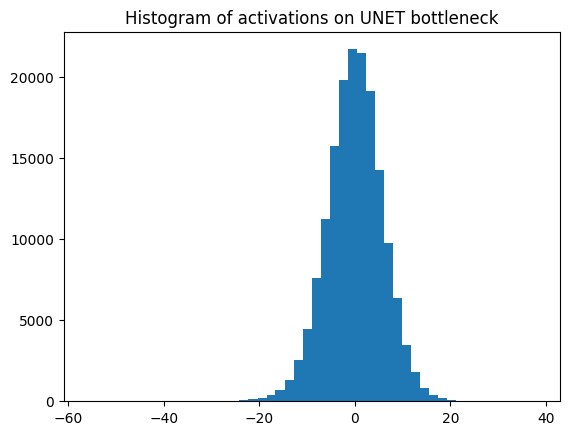

In [92]:
plt.hist(ue.ravel().detach().cpu(),bins=50);
plt.title('Histogram of activations on UNET bottleneck');

In [93]:
#src_todo = src[:1,:,:] # take the first 3 noise steps
#src_todo = src_todo.repeat(10,1,1) # same sample multiple times
src_todo = src
src_todo.shape

torch.Size([31, 80, 16384])

Let's encode our `src` samples using UNET

In [94]:
%%time
ret = []
with autocast("cuda"):
    with torch.no_grad():
        for s in tqdm(src_todo.reshape([-1,4,64,64])):
            in_sample_b = src[0][:batch_size].reshape([batch_size,4,64,64]).to(torch_device)
            latent_model_input = torch.cat([in_sample_b] * 2)
            #latent_model_input = latent_model_input/10000 # scale
            cur_ue = unet.encoder(sample=latent_model_input,
                         timestep=50,
                         encoder_hidden_states=text_embeddings
                        )
            ret += [cur_ue[1].detach().cpu()] # take the first of the two samples; they should be the same

ret = torch.stack(ret)
ret.shape

  0%|          | 0/2480 [00:00<?, ?it/s]

CPU times: user 1min 26s, sys: 195 ms, total: 1min 26s
Wall time: 1min 9s


torch.Size([2480, 1280, 8, 8])

In [95]:
unet_latents = ret.reshape([ret.shape[0],-1])
unet_latents.shape

torch.Size([2480, 81920])

## Let's find the island (UMAP on UNET bottleneck)

In [96]:
%%time
#MODE-1
reducer = umap.UMAP(n_components=2,low_memory=True,random_state=123,n_neighbors=steps*20) # n_neighbours is fundamental

# fitting the first 50% of the "path to escape" then we predict in all of them don't works
#reducer.fit(unet_latents.reshape([*src.shape[:2],-1])[noise_sequence_idxs[:40]].reshape([-1,unet_latents.shape[-1]])); 
# fitting on all latents
reducer.fit(unet_latents); 

src_xy = reducer.transform(unet_latents)
src_xy = src_xy.reshape(unet_latents.shape[0]//latent_samples,latent_samples,-1)
src_xy.shape

CPU times: user 1min 37s, sys: 2.18 s, total: 1min 39s
Wall time: 1min 36s


(31, 80, 2)

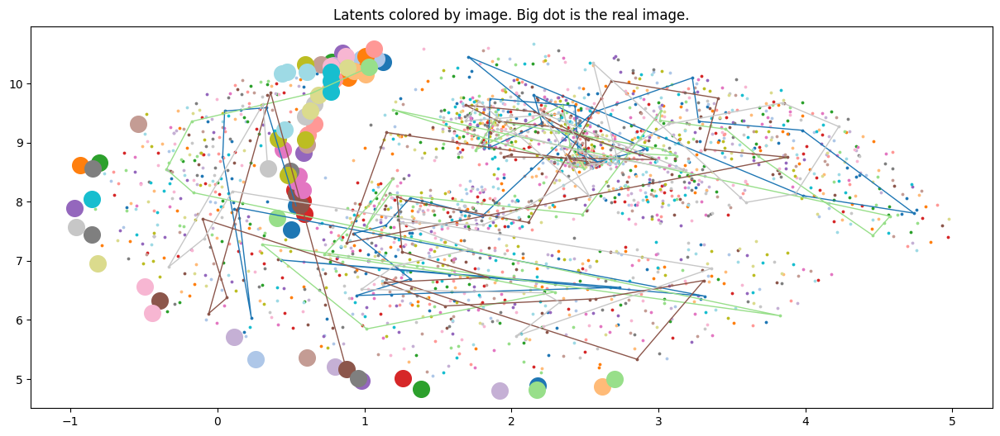

In [97]:
from matplotlib.cm import tab20

plt.figure(figsize=(15,6))
src_xy_t = torch.tensor(src_xy).permute([1,0,2])
for i,c in enumerate(src_xy_t):
    #plt.scatter(c[:,0],c[:,1],s=(len(src_xy_t)-i-1)*1)
    color = tab20(float(i)/len(src_xy_t))
    if i%20==0:
        plt.plot(c[:,0],c[:,1],linewidth=1,color=color)
    plt.scatter(c[:,0],c[:,1],s=3,color=color)
    plt.scatter(c[0,0],c[0,1],s=200,color=color) # start point
    
plt.title('Latents colored by image. Big dot is the real image.');

**IMPORTANT**: This is really promising: points are colored by image; as we can see we start from the big dot (real image) and we follow the "flow" till the most noisy step.
Note that samples are ordered by increasing noise according to `noises` noise values and in this array the first image is the 0-noise real image and we inceasinglly add more noise samples moving towards the last element.

In [98]:
src_xy_t.shape, noises.shape, noises

(torch.Size([80, 31, 2]),
 torch.Size([31]),
 tensor([ 0.0000,  7.5000,  7.5000, 15.0000, 15.0000, 15.0000, 15.0000, 22.5000,
         22.5000, 22.5000, 22.5000, 22.5000, 22.5000, 22.5000, 22.5000, 30.0000,
         30.0000, 30.0000, 30.0000, 30.0000, 30.0000, 30.0000, 30.0000, 30.0000,
         30.0000, 30.0000, 30.0000, 30.0000, 30.0000, 30.0000, 30.0000]))

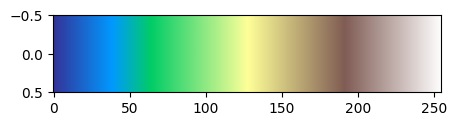

In [99]:
# Let's define the proper color map (we'll discard the snow eventually ;-) )
from matplotlib.cm import terrain
plt.figure(figsize=(5,1))
plt.imshow(terrain(range(255))[None,:,:],aspect='auto');

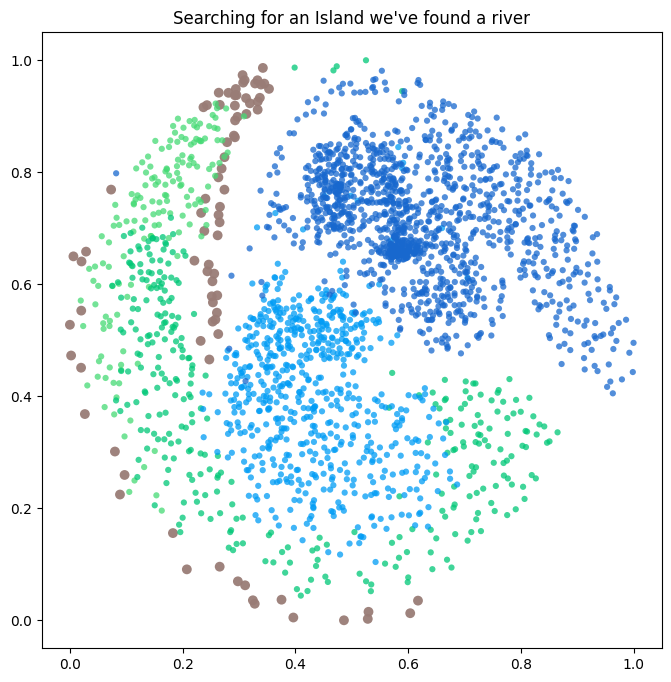

In [100]:
plt.figure(figsize=(8,8))
src_xy_t = torch.tensor(src_xy).permute([0,1,2])

# coord normalization (0..1)
xx = src_xy_t[:,:,0]; yy = src_xy_t[:,:,1]
xx = ((xx-xx.min())/(xx.max()-xx.min()))
yy = ((yy-yy.min())/(yy.max()-yy.min()))
src_xy_t = torch.stack([xx,yy],dim=2) # reensemble

for i,c in enumerate(src_xy_t):
    noise_level = flat_noise_idx[i]
    color = terrain(0.4*(1-float(noise_level)/float(steps)))[:3]
    if i==0:
        plt.scatter(c[:,0],c[:,1],s=50,color=terrain(.8),alpha=.95,edgecolor='none') # start point
    else:
        plt.scatter(c[:,0],c[:,1],s=20,color=color,alpha=.75,edgecolor='none')

#plt.axis('equal');
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05]);
plt.title("Searching for an Island we've found a river");

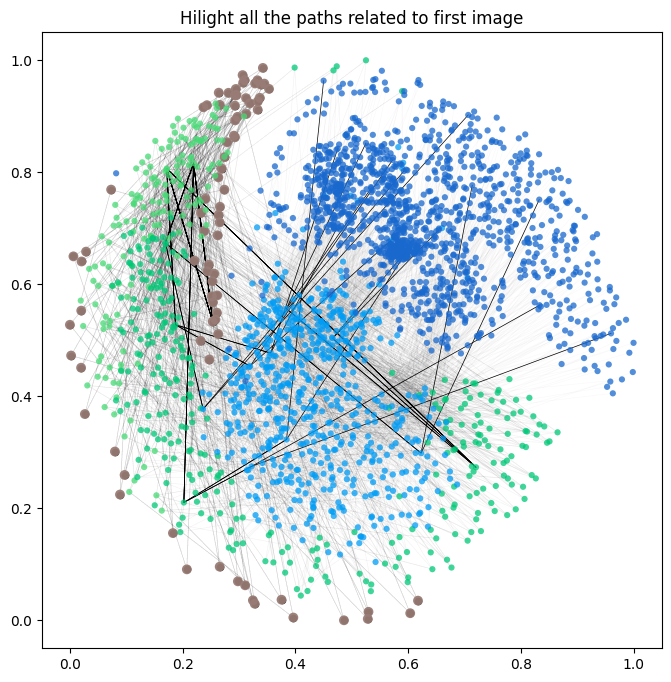

In [101]:
plt.figure(figsize=(8,8))

# Draws all the escape paths
src_xy_t = torch.tensor(src_xy).permute([1,0,2]) # by image

# coord normalization (0..1)
xx = src_xy_t[:,:,0]; yy = src_xy_t[:,:,1]
xx = ((xx-xx.min())/(xx.max()-xx.min()))
yy = ((yy-yy.min())/(yy.max()-yy.min()))
src_xy_t = torch.stack([xx,yy],dim=2) # reensemble

for i,c in enumerate(src_xy_t):
    color = 'k'
    t = plt.scatter(c[0,0],c[0,1],s=20,color=color) # start point
    for noise_sequence_idx in noise_sequence_idxs: # first one
        alpha = 1 if (i==0) else .025 # 
        plt.plot(c[noise_sequence_idx,0],c[noise_sequence_idx,1],color=color,linewidth=.5,alpha=alpha,zorder=0)


# Draws the noise levels
src_xy_t = torch.tensor(src_xy).permute([0,1,2])

# coord normalization (0..1)
xx = src_xy_t[:,:,0]; yy = src_xy_t[:,:,1]
xx = ((xx-xx.min())/(xx.max()-xx.min()))
yy = ((yy-yy.min())/(yy.max()-yy.min()))
src_xy_t = torch.stack([xx,yy],dim=2) # reensemble

for i,c in enumerate(src_xy_t):
    noise_level = flat_noise_idx[i]
    color = terrain(0.4*(1-float(noise_level)/float(steps)))[:3]
    if i==0:
        plt.scatter(c[:,0],c[:,1],s=50,color=terrain(.8),alpha=.95,edgecolor='none') # start point
    else:
        plt.scatter(c[:,0],c[:,1],s=20,color=color,alpha=.75,edgecolor='none')
            
#plt.axis('equal');
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05]);
plt.title('Hilight all the paths related to first image');

In [102]:
%%time
# Decode back all images to prepare them for display
#src_lat = src.reshape([*src.shape[:2],4,64,64])
#imgs = [decode_image(src_lat[j,i,:])]

imgs = [decode_image(i) for i in tqdm(src.reshape([-1,4,64,64]))]
imgs = torch.stack(imgs)
imgs = imgs.reshape([*src.shape[:2],*imgs.shape[1:]])

  0%|          | 0/2480 [00:00<?, ?it/s]

CPU times: user 4min 44s, sys: 5.85 s, total: 4min 50s
Wall time: 4min 42s


0it [00:00, ?it/s]

CPU times: user 2.46 s, sys: 20.3 ms, total: 2.48 s
Wall time: 2.4 s


Text(0.5, 1.0, 'Show encoed images')

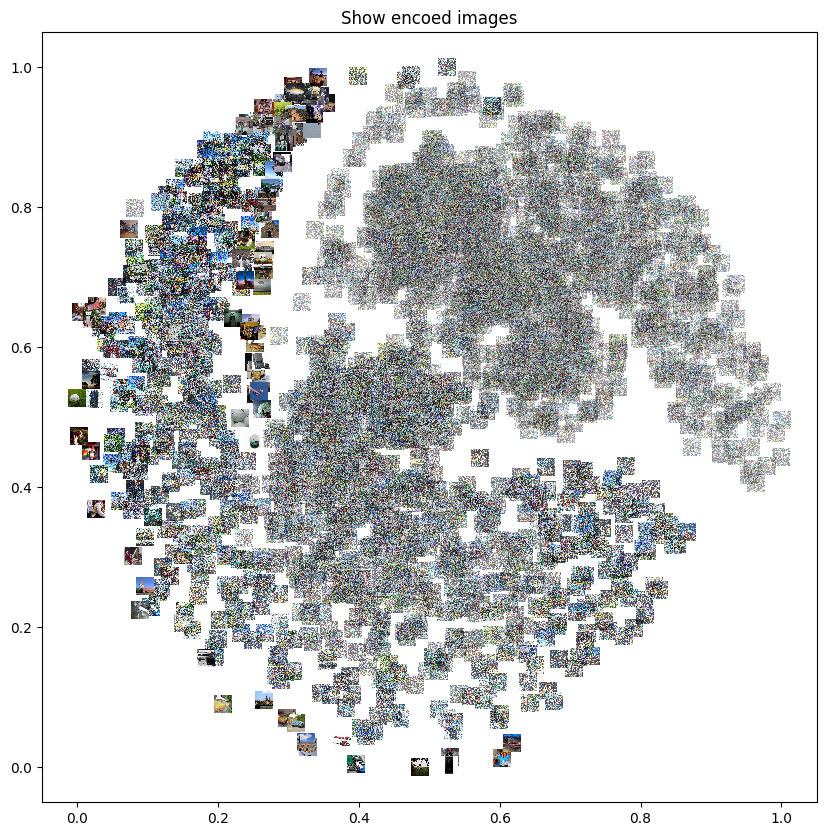

In [103]:
%%time
# Plot code borrowed from great Daniel Kaldor notebook:
# https://github.com/danielkaldor/SDExplain/blob/main/stable-points.ipynb

from matplotlib.offsetbox import OffsetImage, AnnotationBbox

src_xy_t = torch.tensor(src_xy).permute([0,1,2])

# coord normalization (0..1)
xx = src_xy_t[:,:,0]; yy = src_xy_t[:,:,1]
xx = ((xx-xx.min())/(xx.max()-xx.min()))
yy = ((yy-yy.min())/(yy.max()-yy.min()))
src_xy_t = torch.stack([xx,yy],dim=2) # reensemble

fig, ax = plt.subplots(1,1,figsize=(10,10))
ax.scatter(*src_xy_t.reshape([-1,2]).T,alpha=0)
src_lat = src.reshape([*src.shape[:2],4,64,64])

max_noise_level = flat_noise_idx.max()
for j,c in tqdm(enumerate(src_xy_t)):
    for i, (x,y) in enumerate(c):
        #if i % 10 != 0: continue
        noise_level = flat_noise_idx[j]
        alpha = (3+max_noise_level-noise_level)/(3+max_noise_level)
        ab = AnnotationBbox(OffsetImage(imgs[j,i,:], zoom=0.025, alpha=alpha), (x, y), frameon=False, zorder=100-noise_level)
        ax.add_artist(ab)
        
#plt.axis('equal');
plt.xlim([-0.05,1.05])
plt.ylim([-0.05,1.05]);
plt.title('Show encoed images');

In [104]:
%%time
# With tsne we shoult "lay out" all out data at once
tsne = TSNE(random_state = 123, n_components=2,verbose=1, perplexity=4, n_iter=100000, learning_rate='auto') #, init='pca'
src_xy = tsne.fit_transform(unet_latents)
src_xy = src_xy.reshape(unet_latents.shape[0]//latent_samples,latent_samples,-1)
src_xy.shape

/home/dldev/.conda/envs/dldev/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


[t-SNE] Computing 13 nearest neighbors...
[t-SNE] Indexed 2480 samples in 0.072s...
[t-SNE] Computed neighbors for 2480 samples in 4.667s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2480
[t-SNE] Computed conditional probabilities for sample 2000 / 2480
[t-SNE] Computed conditional probabilities for sample 2480 / 2480
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 138.091599
[t-SNE] KL divergence after 850 iterations: 4.375286
CPU times: user 1min 49s, sys: 55.1 s, total: 2min 45s
Wall time: 7.39 s


(31, 80, 2)

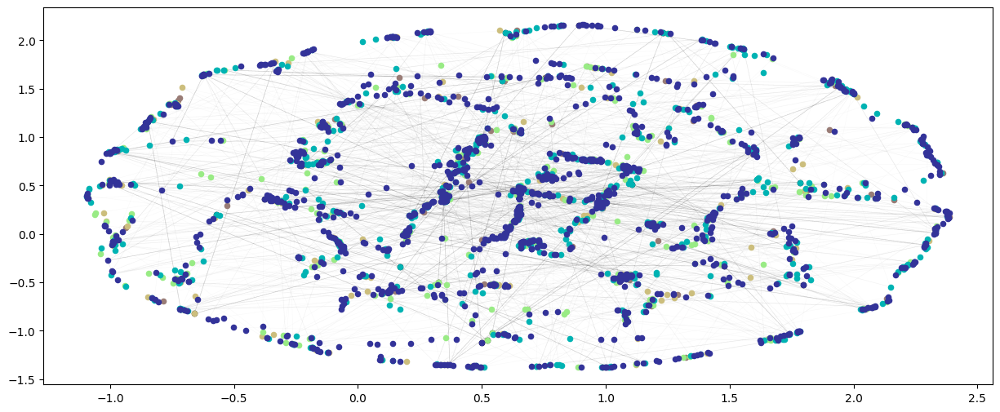

In [105]:
plt.figure(figsize=(15,6))
src_xy_t = torch.tensor(src_xy).permute([0,1,2])
for i,c in enumerate(src_xy_t):
    color = 'k'
    t = plt.scatter(c[0,0],c[0,1],s=20,color=color) # start point
    for noise_sequence_idx in noise_sequence_idxs: # first one
        plt.plot(c[noise_sequence_idx,0],c[noise_sequence_idx,1],color=color,linewidth=.5,alpha=.025,zorder=0)

src_xy_t = torch.tensor(src_xy).permute([0,1,2])
for i,c in enumerate(src_xy_t):
    noise_level = flat_noise_idx[i]
    color = terrain(0.8*(1-float(noise_level)/float(steps-1)))[:3]
    plt.scatter(c[:,0],c[:,1],s=20,color=color)

TSNE don't seems to be able to properly grasp the manifold structure.